In [1]:
# examination of site effects and harmonization strategies in IXI
#
# author: Lee Jollans, PhD
#
# based on similar analyses reported in:
#
# Fortin, J. P., Cullen, N., Sheline, Y. I., Taylor, W. D., Aselcioglu, 
# I., Cook, P. A., ... & McInnis, M. (2018). Harmonization of cortical 
# thickness measurements across scanners and sites. Neuroimage, 167, 104-120.
#
# Pomponio, R., Erus, G., Habes, M., Doshi, J., Srinivasan, D., 
# Mamourian, E., ... & Launer, L. J. (2020). Harmonization of large MRI 
# datasets for the analysis of brain imaging patterns throughout the lifespan. 
# NeuroImage, 208, 116450.

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [75]:
# load in the IXI data
import pandas as pd
ixi_features = pd.read_csv('/Users/lee_jollans/Projects/clustering_pilot/sixi_s3_outliers_nans_removed_sort_withsite_CTchk.csv')
ixi_features.describe()

,L_bankssts_surfavg,L_caudalanteriorcingulate_surfavg,L_caudalmiddlefrontal_surfavg,L_cuneus_surfavg,L_entorhinal_surfavg,L_fusiform_surfavg,L_inferiorparietal_surfavg,L_inferiortemporal_surfavg,L_isthmuscingulate_surfavg,L_lateraloccipital_surfavg,...,IXI_ID,sex_pheno,HEIGHT,WEIGHT,site_pheno,MARITAL_ID,OCCUPATION_ID,QUALIFICATION_ID,consensusage_pheno,SITE
count,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,...,549.000000,549.000000,549.000000,549.000000,549.00000,549.000000,549.000000,549.00000,549.000000,549.000000
mean,978.204007,578.670310,2159.535519,1470.817851,454.242259,3046.240437,4257.515483,3288.424408,930.120219,4901.371585,...,322.659381,1.551913,167.163934,73.353370,1.43898,2.089253,2.561020,3.95082,48.250207,0.808743
std,172.598460,138.524019,352.796230,230.197796,93.721797,415.306949,642.424935,531.045763,163.707123,641.268770,...,184.878236,0.497751,99.772965,58.036759,1.10672,1.195053,2.015092,1.46222,16.245275,0.629155
min,623.000000,254.000000,1396.000000,880.000000,233.000000,2042.000000,2727.000000,2026.000000,459.000000,3293.000000,...,2.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,20.071184,0.000000
25%,855.000000,481.000000,1902.000000,1310.000000,387.000000,2751.000000,3811.000000,2925.000000,815.000000,4431.000000,...,162.000000,1.000000,162.000000,60.000000,1.00000,1.000000,1.000000,3.00000,33.593429,0.000000
50%,961.000000,566.000000,2143.000000,1447.000000,445.000000,2983.000000,4187.000000,3242.000000,918.000000,4857.000000,...,318.000000,2.000000,168.000000,70.000000,1.00000,2.000000,1.000000,5.00000,48.101300,1.000000
75%,1067.000000,659.000000,2376.000000,1620.000000,511.000000,3298.000000,4663.000000,3627.000000,1031.000000,5351.000000,...,481.000000,2.000000,177.000000,80.000000,1.00000,3.000000,5.000000,5.00000,61.785079,1.000000
max,1899.000000,1128.000000,3445.000000,2452.000000,862.000000,4335.000000,6643.000000,5078.000000,1486.000000,7182.000000,...,662.000000,2.000000,1850.000000,960.000000,6.00000,5.000000,8.000000,5.00000,86.318960,2.000000


In [76]:
# fetch only the cortical thickness features
import re 
import numpy as np

find_CT=[re.search('thick', list(ixi_features)[i])==None for i in range(len(list(ixi_features)))]
indices = [i for i, x in enumerate(find_CT) if x == False]
dfCT = pd.DataFrame(ixi_features.values[:, indices], ixi_features.index, ixi_features.columns[indices])
X=np.vstack(dfCT.values)
medianX = np.median(X,axis=1)
dfCT['site']=ixi_features['SITE']
dfCT['age']=ixi_features['consensusage_pheno']
dfCT['sex']=ixi_features['sex_pheno']
dfCT['medianCT']=medianX
dfCT['ICV']=ixi_features['ICV']
dfCT['Ethnicity']=ixi_features['site_pheno']
site=ixi_features['SITE'].to_numpy()
dfCT.head()

,L_bankssts_thickavg,L_caudalanteriorcingulate_thickavg,L_caudalmiddlefrontal_thickavg,L_cuneus_thickavg,L_entorhinal_thickavg,L_fusiform_thickavg,L_inferiorparietal_thickavg,L_inferiortemporal_thickavg,L_isthmuscingulate_thickavg,L_lateraloccipital_thickavg,...,R_frontalpole_thickavg,R_temporalpole_thickavg,R_transversetemporal_thickavg,R_insula_thickavg,site,age,sex,medianCT,ICV,Ethnicity
0,2.384,2.794,2.695,1.926,3.174,2.916,2.447,2.944,2.695,2.059,...,3.087,4.317,2.526,3.041,1,35.800137,2,2.694,1550370,1
1,2.618,2.24,2.507,1.812,3.313,2.435,2.389,2.812,2.179,2.01,...,2.335,3.62,2.137,2.692,0,38.781656,1,2.422,1846870,1
2,2.417,2.403,2.449,1.574,3.211,2.483,2.424,2.813,2.284,1.899,...,2.259,3.292,1.958,2.873,0,46.710472,1,2.424,1704000,1
3,2.494,2.655,2.364,1.55,3.42,2.459,2.418,2.592,2.604,2.113,...,3.083,3.702,1.865,2.925,0,34.236824,2,2.48,1376040,1
4,2.598,2.458,2.558,1.773,3.625,2.492,2.323,2.7,2.213,2.095,...,2.682,3.821,2.24,3.227,0,24.284736,1,2.5365,1703500,2


In [77]:
# how many sites are there and n for each
site_n=np.array([len(np.where(site==i)[0]) for i in np.unique(site)])
print(site_n)

[171 312  66]


In [78]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
# median CT differences between sites
from scipy import stats
print(stats.ttest_ind(medianX[np.where(site==0)[0]],medianX[np.where(site==1)[0]]))
print(stats.ttest_ind(medianX[np.where(site==0)[0]],medianX[np.where(site==2)[0]]))
print(stats.ttest_ind(medianX[np.where(site==1)[0]],medianX[np.where(site==2)[0]]))
# plot sorted by age
age=dfCT['age'].to_numpy()
agesort = np.argsort(age)
from sklearn.preprocessing import StandardScaler
# ew want each feature to have a zero mean
x = StandardScaler().fit_transform(X)
#x.shape
#plt.plot(np.nanmean(X,axis=0)); plt.show()
#plt.plot(np.nanmean(x,axis=0)); plt.show()
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
PCs = pca.fit_transform(x)
PCs.shape

Ttest_indResult(statistic=4.5930065514316585, pvalue=5.586702018196643e-06)
Ttest_indResult(statistic=-0.07512517355392076, pvalue=0.9401790309284823)
Ttest_indResult(statistic=-3.3972344810672968, pvalue=0.0007534444423728829)


(549, 3)

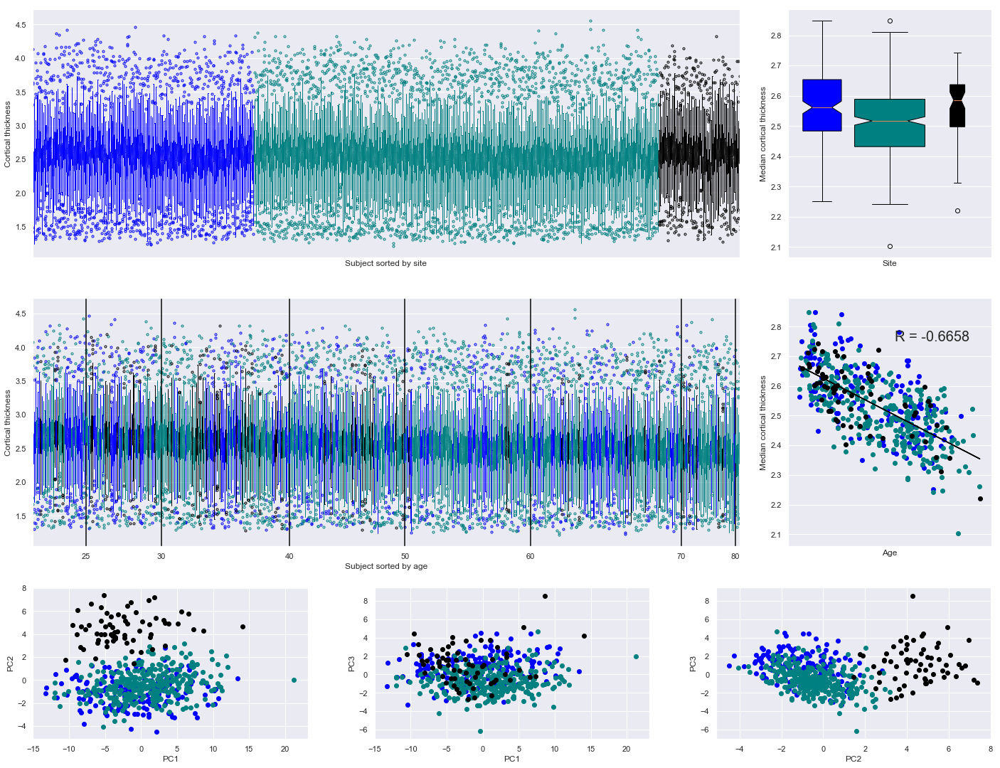

<Figure size 432x288 with 0 Axes>

In [80]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})

# put all plots together into one
c2use=['blue','teal','black']

fig=plt.figure(figsize=[20,15])

# A
ax1 = plt.subplot2grid((8, 4), (0, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    plt.boxplot(X[np.where(site==site2plot)[0],:].T, positions=np.arange(site_n[site2plot])+np.sum(site_n[:site2plot]), notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by site')
plt.tight_layout()

#B
ax1 = plt.subplot2grid((8, 4), (0, 3), colspan=1, rowspan=3)
d=[medianX[np.where(site==0)[0]],medianX[np.where(site==1)[0]],medianX[np.where(site==2)[0]]]
c2 = "purple"
box1 = plt.boxplot(d, notch=True, patch_artist=True, widths=site_n/300)
for patch, color in zip(box1['boxes'], c2use):
    patch.set_facecolor(color)
plt.ylabel('Median cortical thickness')
plt.xlabel('Site')
plt.xticks([],[])
plt.tight_layout()

#C
ax1 = plt.subplot2grid((8, 4), (3, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    
    XX=X[agesort,:]
    ssite=site[agesort]
    
    plt.boxplot(XX[np.where(ssite==site2plot)[0],:].T, positions=np.where(ssite==site2plot)[0], notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by age')
whereage = np.array([np.where(abs(age[agesort]-l)==np.nanmin(abs(age[agesort]-l)))[0][0] for l in [25,30,40,50,60,70,80]])
plt.xticks(whereage,[25,30,40,50,60,70,80])
[plt.axvline(x=l,c='black') for l in whereage]
plt.tight_layout()

#D
ax1 = plt.subplot2grid((8, 4), (3, 3), colspan=1, rowspan=3)
for site2plot in range(3):
    plt.scatter(age[np.where(site==site2plot)[0]], medianX[np.where(site==site2plot)[0]],c=c2use[site2plot])
plt.ylabel('Median cortical thickness')
plt.xlabel('Age')
plt.xticks([],[])
x=age
y=medianX.astype(float)
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
plt.plot(x, intercept + slope * x, c='black')
plt.text(55,2.75,('R = ' + str(np.round(np.corrcoef(x,y)[0,1],4))), fontsize=20)
plt.tight_layout()

#E
ax1 = plt.subplot2grid((8, 3), (6, 0), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs[np.where(site==site2plot)[0],0], PCs[np.where(site==site2plot)[0],1],c=c2use[site2plot])
plt.ylabel('PC2'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 1), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs[np.where(site==site2plot)[0],0], PCs[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 2), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs[np.where(site==site2plot)[0],1], PCs[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC2')
plt.show()

plt.tight_layout()
plt.show()

In [106]:
import statsmodels.api as sm
from scipy import stats
X = StandardScaler().fit_transform(X)

# correction method 1: residuls (only site, not age or sex)
Xresid = np.full([X.shape[0], X.shape[1]], np.nan)
for i in range(0, X.shape[1]):
    crit=X[:, i].astype(float)
    model = sm.OLS(crit, site).fit()
    Xresid[:, i] = crit - model.predict(site)
    
print('residuals:')
medX=np.nanmedian(Xresid,axis=1)
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==1)[0]]))
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==2)[0]]))
print(stats.ttest_ind(medX[np.where(site==1)[0]],medX[np.where(site==2)[0]]))
    
# correction method 2: adjusted residuls (site, age, age2, ICV and sex)
bio_cov=np.vstack(dfCT[['site','age','sex','ICV','Ethnicity']].values)
bio_cov=np.append(bio_cov,np.expand_dims(np.square(bio_cov[:,1]),axis=1),axis=1)
Xadjresid = np.full([X.shape[0], X.shape[1]], np.nan)
for i in range(0, X.shape[1]):
    crit=X[:, i].astype(float)
    model = sm.OLS(crit, bio_cov).fit()
    Xadjresid[:, i] = crit - model.predict(bio_cov)

print('adjusted residuals:')
medX=np.nanmedian(Xadjresid,axis=1)
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==1)[0]]))
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==2)[0]]))
print(stats.ttest_ind(medX[np.where(site==1)[0]],medX[np.where(site==2)[0]]))
    
# correction method 3: neurocombat
import neuroCombat as cb

Xcombat = cb.neuroCombat(X.T,pd.DataFrame(bio_cov),0,2,[1,3,4,5])
Xcombat=Xcombat.T

print('combat:')
medX=np.nanmedian(Xcombat,axis=1)
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==1)[0]]))
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==2)[0]]))
print(stats.ttest_ind(medX[np.where(site==1)[0]],medX[np.where(site==2)[0]]))

# correction method 4: neurocombat and then residualize for biological variables
bio_cov=np.vstack(dfCT[['site','age','sex','ICV','Ethnicity']].values)
bio_cov=np.append(bio_cov,np.expand_dims(np.square(bio_cov[:,1]),axis=1),axis=1)
Xadjcombat = np.full([X.shape[0], X.shape[1]], np.nan)
for i in range(0, X.shape[1]):
    crit=Xcombat[:, i].astype(float)
    model = sm.OLS(crit, bio_cov).fit()
    Xadjcombat[:, i] = crit - model.predict(bio_cov)
    
print('adjusted combat:')
medX=np.nanmedian(Xadjcombat,axis=1)
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==1)[0]]))
print(stats.ttest_ind(medX[np.where(site==0)[0]],medX[np.where(site==2)[0]]))
print(stats.ttest_ind(medX[np.where(site==1)[0]],medX[np.where(site==2)[0]]))

residuals:
Ttest_indResult(statistic=3.1495179437722665, pvalue=0.0017371828604225402)
Ttest_indResult(statistic=-1.6064927495977632, pvalue=0.10950850508735623)
Ttest_indResult(statistic=-4.173295233314557, pvalue=3.733009795791366e-05)
adjusted residuals:
Ttest_indResult(statistic=2.4600388944468623, pvalue=0.014242814579588757)
Ttest_indResult(statistic=-0.3070207231613642, pvalue=0.7590994821307642)
Ttest_indResult(statistic=-2.2296943841245174, pvalue=0.026357679566963072)
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
combat:
Ttest_indResult(statistic=1.8403267366983282, pvalue=0.06633614130150078)
Ttest_indResult(statistic=-1.2842398691276873, pvalue=0.20032265991279216)
Ttest_indResult(statistic=-2.751638436563801, pvalue=0.006216867695015024)
adjusted combat:
Ttest_indResult(statistic=0.5554055997056758, p

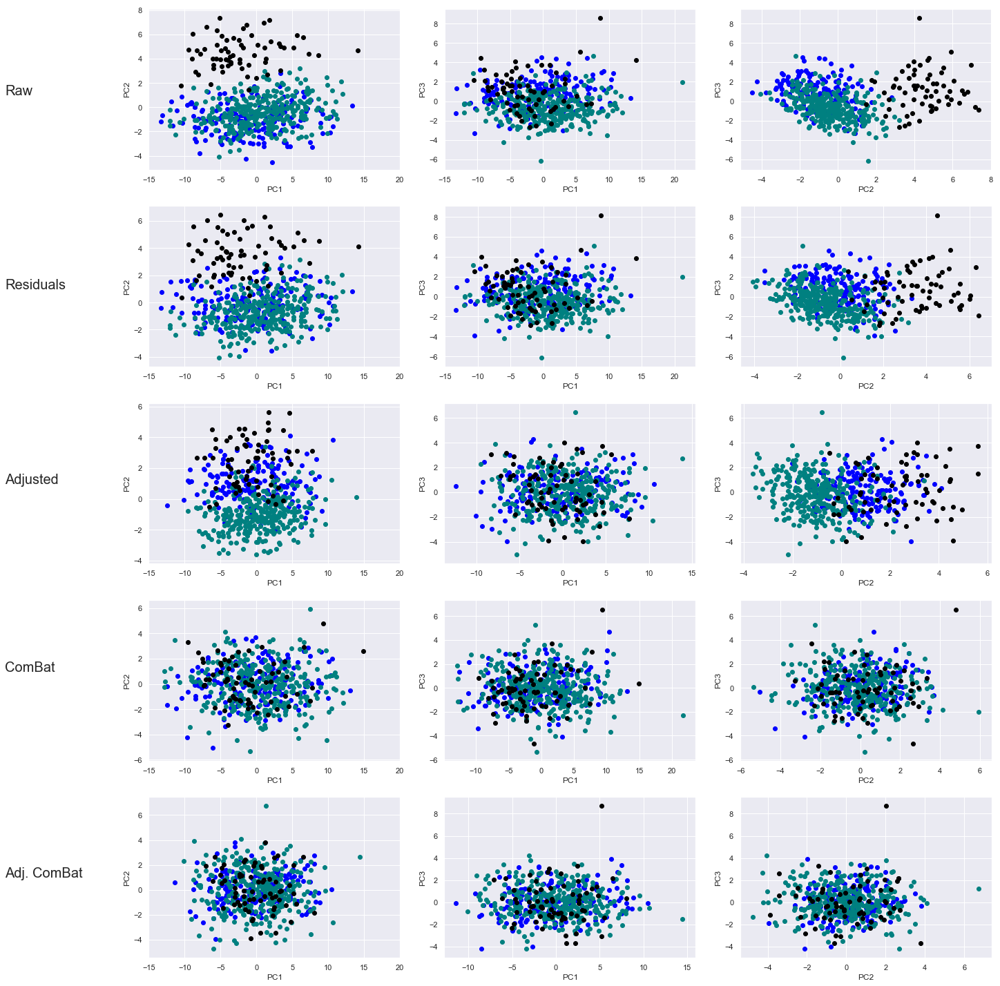

In [103]:
PCs = PCA(n_components=3).fit_transform(X)
PCs_resid = PCA(n_components=3).fit_transform(Xresid)
PCs_adjresid = PCA(n_components=3).fit_transform(Xadjresid)
PCs_combat = PCA(n_components=3).fit_transform(Xcombat)
PCs_adjcombat = PCA(n_components=3).fit_transform(Xadjcombat)


labels=['Raw','Residuals','Adjusted','ComBat','Adj. ComBat']

fig=plt.figure(figsize=[20,20])
ctr=0
ctr2=0
for pcs in [PCs, PCs_resid, PCs_adjresid, PCs_combat, PCs_adjcombat]:
    ctr+=1
    plt.subplot(5,3,ctr); 
    for site2plot in range(3):
        plt.scatter(pcs[np.where(site==site2plot)[0],0], pcs[np.where(site==site2plot)[0],1],c=c2use[site2plot])
    plt.ylabel('PC2'); plt.xlabel('PC1')
    plt.text(-35,1,labels[ctr2], fontsize=20)
    plt.xlim([-15,20])
    ctr2+=1
    ctr+=1
    plt.subplot(5,3,ctr); 
    for site2plot in range(3):
        plt.scatter(pcs[np.where(site==site2plot)[0],0], pcs[np.where(site==site2plot)[0],2],c=c2use[site2plot])
    plt.ylabel('PC3'); plt.xlabel('PC1')
    ctr+=1
    plt.subplot(5,3,ctr); 
    for site2plot in range(3):
        plt.scatter(pcs[np.where(site==site2plot)[0],1], pcs[np.where(site==site2plot)[0],2],c=c2use[site2plot])
    plt.ylabel('PC3'); plt.xlabel('PC2')
    
    
plt.tight_layout()
plt.show()

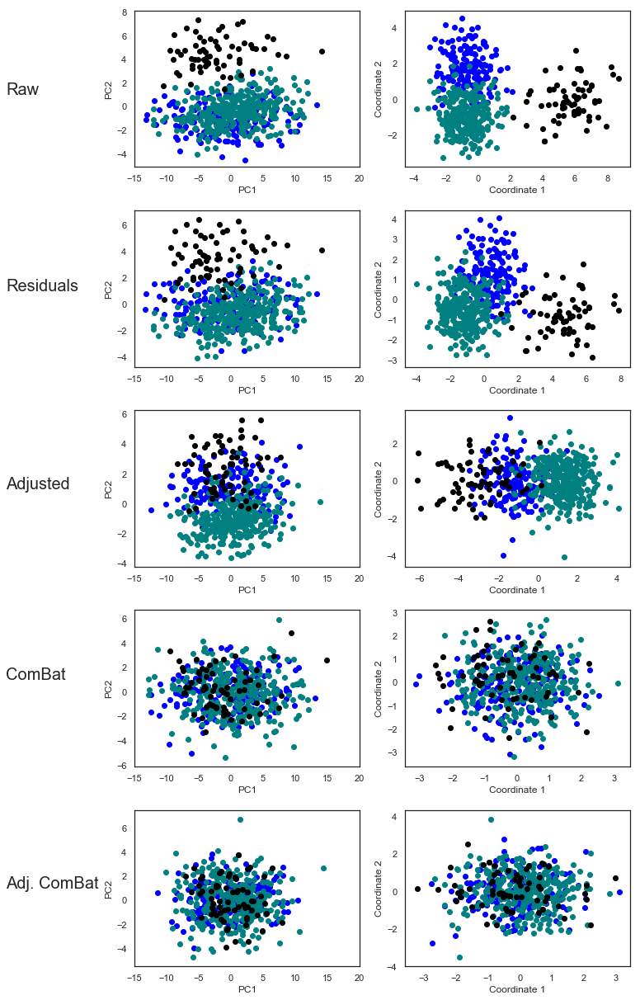

In [104]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

sns.set_style("white")

PCs = PCA(n_components=2).fit_transform(X)
PCs_resid = PCA(n_components=2).fit_transform(Xresid)
PCs_adjresid = PCA(n_components=2).fit_transform(Xadjresid)
PCs_combat = PCA(n_components=2).fit_transform(Xcombat)
PCs_adjcombat = PCA(n_components=3).fit_transform(Xadjcombat)

LDs = LinearDiscriminantAnalysis(n_components=2).fit(X.astype(float), site).transform(X.astype(float))
LDs_resid = LinearDiscriminantAnalysis(n_components=2).fit(Xresid.astype(float), site).transform(Xresid.astype(float))
LDs_adjresid = LinearDiscriminantAnalysis(n_components=2).fit(Xadjresid.astype(float), site).transform(Xadjresid.astype(float))
LDs_combat = LinearDiscriminantAnalysis(n_components=2).fit(Xcombat.astype(float), site).transform(Xcombat.astype(float))
LDs_adjcombat = LinearDiscriminantAnalysis(n_components=2).fit(Xadjcombat.astype(float), site).transform(Xadjcombat.astype(float))

labels=['Raw','Residuals','Adjusted','ComBat', 'Adj. ComBat']

fig=plt.figure(figsize=[11,17])
ctr=0
for pcs in [PCs, PCs_resid, PCs_adjresid, PCs_combat,PCs_adjcombat]:
    plt.subplot(5,2,(ctr)*2+1); 
    for site2plot in range(3):
        plt.scatter(pcs[np.where(site==site2plot)[0],0], pcs[np.where(site==site2plot)[0],1],c=c2use[site2plot])
    plt.ylabel('PC2'); plt.xlabel('PC1')
    plt.text(-35,1,labels[ctr], fontsize=20)
    plt.xlim([-15,20])
    ctr+=1
ctr=0
for pcs in [LDs, LDs_resid, LDs_adjresid, LDs_combat,LDs_adjcombat]:
    plt.subplot(5,2,(ctr)*2+2); 
    for site2plot in range(3):
        plt.scatter(pcs[np.where(site==site2plot)[0],0], pcs[np.where(site==site2plot)[0],1],c=c2use[site2plot])
    plt.ylabel('Coordinate 2'); plt.xlabel('Coordinate 1')
    ctr+=1


plt.tight_layout()
plt.show()




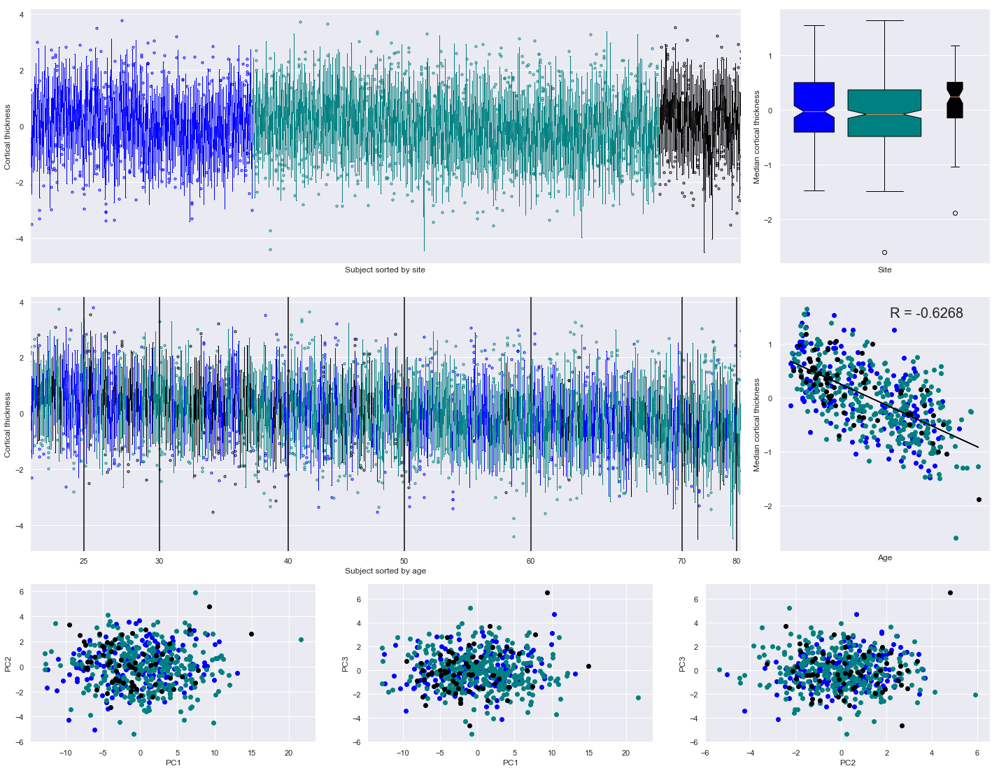

<Figure size 432x288 with 0 Axes>

In [101]:
fig=plt.figure(figsize=[20,15])
sns.set()
# A
ax1 = plt.subplot2grid((8, 4), (0, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    plt.boxplot(Xcombat[np.where(site==site2plot)[0],:].T, positions=np.arange(site_n[site2plot])+np.sum(site_n[:site2plot]), notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by site')
plt.tight_layout()

#B
medianXcombat=np.median(Xcombat,axis=1)
ax1 = plt.subplot2grid((8, 4), (0, 3), colspan=1, rowspan=3)
d=[medianXcombat[np.where(site==0)[0]],medianXcombat[np.where(site==1)[0]],medianXcombat[np.where(site==2)[0]]]
c2 = "purple"
box1 = plt.boxplot(d, notch=True, patch_artist=True, widths=site_n/300)
for patch, color in zip(box1['boxes'], c2use):
    patch.set_facecolor(color)
plt.ylabel('Median cortical thickness')
plt.xlabel('Site')
plt.xticks([],[])
plt.tight_layout()

#C
ax1 = plt.subplot2grid((8, 4), (3, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    
    XX=Xcombat[agesort,:]
    ssite=site[agesort]
    
    plt.boxplot(XX[np.where(ssite==site2plot)[0],:].T, positions=np.where(ssite==site2plot)[0], notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by age')
whereage = np.array([np.where(abs(age[agesort]-l)==np.nanmin(abs(age[agesort]-l)))[0][0] for l in [25,30,40,50,60,70,80]])
plt.xticks(whereage,[25,30,40,50,60,70,80])
[plt.axvline(x=l,c='black') for l in whereage]
plt.tight_layout()

#D
ax1 = plt.subplot2grid((8, 4), (3, 3), colspan=1, rowspan=3)
for site2plot in range(3):
    plt.scatter(age[np.where(site==site2plot)[0]], medianXcombat[np.where(site==site2plot)[0]],c=c2use[site2plot])
plt.ylabel('Median cortical thickness')
plt.xlabel('Age')
plt.xticks([],[])
x=age
y=medianXcombat.astype(float)
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
plt.plot(x, intercept + slope * x, c='black')
plt.text(55,1.5,('R = ' + str(np.round(np.corrcoef(x,y)[0,1],4))), fontsize=20)
plt.tight_layout()

#E
PCs_combat = PCA(n_components=3).fit_transform(Xcombat)
ax1 = plt.subplot2grid((8, 3), (6, 0), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_combat[np.where(site==site2plot)[0],0], PCs_combat[np.where(site==site2plot)[0],1],c=c2use[site2plot])
plt.ylabel('PC2'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 1), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_combat[np.where(site==site2plot)[0],0], PCs_combat[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 2), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_combat[np.where(site==site2plot)[0],1], PCs_combat[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC2')
plt.show()

plt.tight_layout()
plt.show()

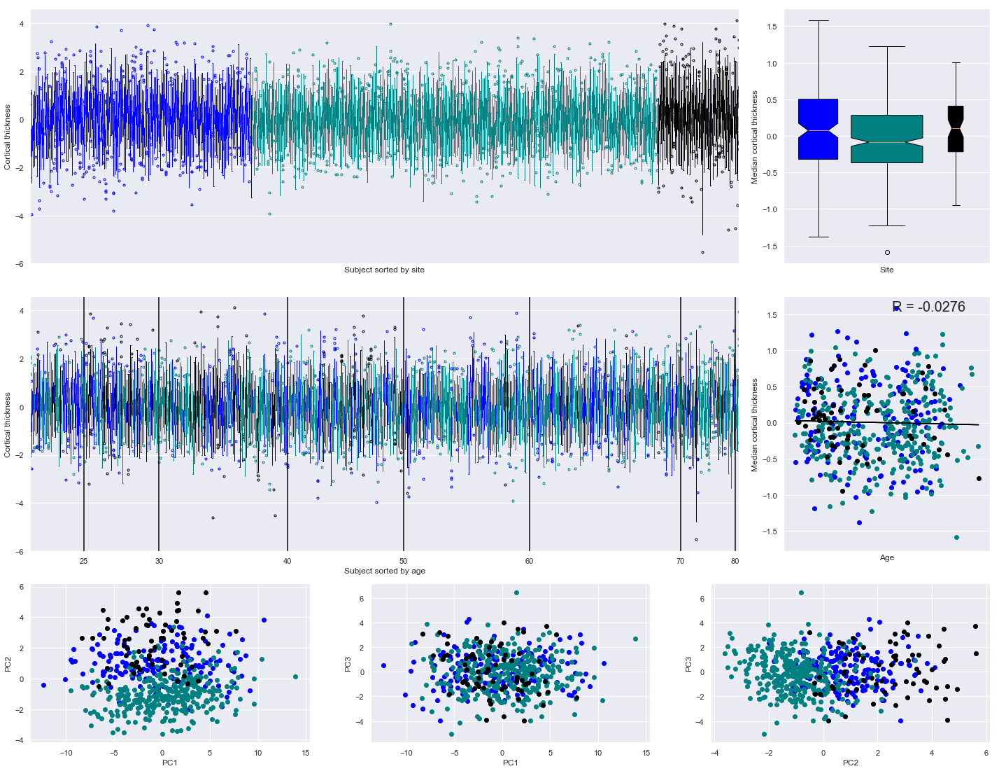

<Figure size 432x288 with 0 Axes>

In [100]:
fig=plt.figure(figsize=[20,15])
sns.set()
# A
ax1 = plt.subplot2grid((8, 4), (0, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    plt.boxplot(Xadjresid[np.where(site==site2plot)[0],:].T, positions=np.arange(site_n[site2plot])+np.sum(site_n[:site2plot]), notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by site')
plt.tight_layout()

#B
medianXadjresid=np.median(Xadjresid,axis=1)
ax1 = plt.subplot2grid((8, 4), (0, 3), colspan=1, rowspan=3)
d=[medianXadjresid[np.where(site==0)[0]],medianXadjresid[np.where(site==1)[0]],medianXadjresid[np.where(site==2)[0]]]
c2 = "purple"
box1 = plt.boxplot(d, notch=True, patch_artist=True, widths=site_n/300)
for patch, color in zip(box1['boxes'], c2use):
    patch.set_facecolor(color)
plt.ylabel('Median cortical thickness')
plt.xlabel('Site')
plt.xticks([],[])
plt.tight_layout()

#C
ax1 = plt.subplot2grid((8, 4), (3, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    
    XX=Xadjresid[agesort,:]
    ssite=site[agesort]
    
    plt.boxplot(XX[np.where(ssite==site2plot)[0],:].T, positions=np.where(ssite==site2plot)[0], notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by age')
whereage = np.array([np.where(abs(age[agesort]-l)==np.nanmin(abs(age[agesort]-l)))[0][0] for l in [25,30,40,50,60,70,80]])
plt.xticks(whereage,[25,30,40,50,60,70,80])
[plt.axvline(x=l,c='black') for l in whereage]
plt.tight_layout()

#D
ax1 = plt.subplot2grid((8, 4), (3, 3), colspan=1, rowspan=3)
for site2plot in range(3):
    plt.scatter(age[np.where(site==site2plot)[0]], medianXadjresid[np.where(site==site2plot)[0]],c=c2use[site2plot])
plt.ylabel('Median cortical thickness')
plt.xlabel('Age')
plt.xticks([],[])
x=age
y=medianXadjresid.astype(float)
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
plt.plot(x, intercept + slope * x, c='black')
plt.text(55,1.55,('R = ' + str(np.round(np.corrcoef(x,y)[0,1],4))), fontsize=20)
plt.tight_layout()

#E
PCs_adjresid = PCA(n_components=3).fit_transform(Xadjresid)
ax1 = plt.subplot2grid((8, 3), (6, 0), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_adjresid[np.where(site==site2plot)[0],0], PCs_adjresid[np.where(site==site2plot)[0],1],c=c2use[site2plot])
plt.ylabel('PC2'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 1), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_adjresid[np.where(site==site2plot)[0],0], PCs_adjresid[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 2), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_adjresid[np.where(site==site2plot)[0],1], PCs_adjresid[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC2')
plt.show()

plt.tight_layout()
plt.show()

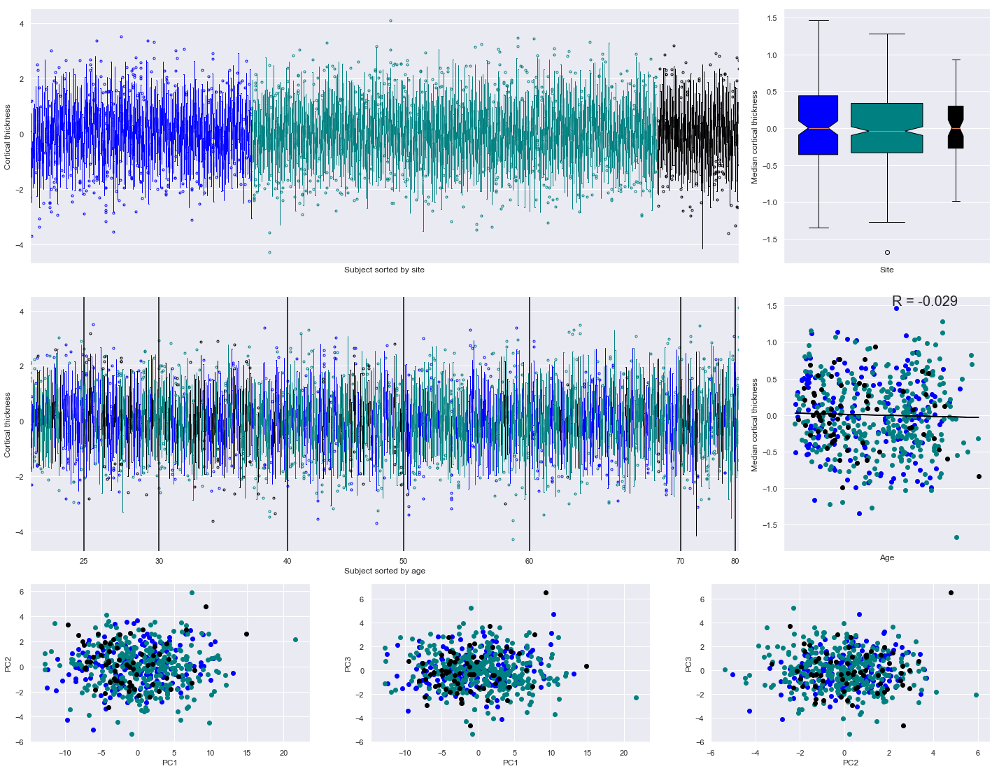

<Figure size 432x288 with 0 Axes>

In [105]:
fig=plt.figure(figsize=[20,15])
sns.set()
# A
ax1 = plt.subplot2grid((8, 4), (0, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    plt.boxplot(Xadjcombat[np.where(site==site2plot)[0],:].T, positions=np.arange(site_n[site2plot])+np.sum(site_n[:site2plot]), notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by site')
plt.tight_layout()

#B
medianXadjcombat=np.median(Xadjcombat,axis=1)
ax1 = plt.subplot2grid((8, 4), (0, 3), colspan=1, rowspan=3)
d=[medianXadjcombat[np.where(site==0)[0]],medianXadjcombat[np.where(site==1)[0]],medianXadjcombat[np.where(site==2)[0]]]
c2 = "purple"
box1 = plt.boxplot(d, notch=True, patch_artist=True, widths=site_n/300)
for patch, color in zip(box1['boxes'], c2use):
    patch.set_facecolor(color)
plt.ylabel('Median cortical thickness')
plt.xlabel('Site')
plt.xticks([],[])
plt.tight_layout()

#C
ax1 = plt.subplot2grid((8, 4), (3, 0), colspan=3, rowspan=3)
for site2plot in range(3):
    c = c2use[site2plot]
    
    XX=Xadjcombat[agesort,:]
    ssite=site[agesort]
    
    plt.boxplot(XX[np.where(ssite==site2plot)[0],:].T, positions=np.where(ssite==site2plot)[0], notch=True, patch_artist=True,
                boxprops=dict(facecolor=c, color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c,marker='.'),
                medianprops=dict(color=c),
                )
plt.xlim([0,545])
plt.xticks([],[])
plt.ylabel('Cortical thickness')
plt.xlabel('Subject sorted by age')
whereage = np.array([np.where(abs(age[agesort]-l)==np.nanmin(abs(age[agesort]-l)))[0][0] for l in [25,30,40,50,60,70,80]])
plt.xticks(whereage,[25,30,40,50,60,70,80])
[plt.axvline(x=l,c='black') for l in whereage]
plt.tight_layout()

#D
ax1 = plt.subplot2grid((8, 4), (3, 3), colspan=1, rowspan=3)
for site2plot in range(3):
    plt.scatter(age[np.where(site==site2plot)[0]], medianXadjcombat[np.where(site==site2plot)[0]],c=c2use[site2plot])
plt.ylabel('Median cortical thickness')
plt.xlabel('Age')
plt.xticks([],[])
x=age
y=medianXadjcombat.astype(float)
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
plt.plot(x, intercept + slope * x, c='black')
plt.text(55,1.5,('R = ' + str(np.round(np.corrcoef(x,y)[0,1],4))), fontsize=20)
plt.tight_layout()

#E
PCs_adjcombat = PCA(n_components=3).fit_transform(Xcombat)
ax1 = plt.subplot2grid((8, 3), (6, 0), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_adjcombat[np.where(site==site2plot)[0],0], PCs_adjcombat[np.where(site==site2plot)[0],1],c=c2use[site2plot])
plt.ylabel('PC2'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 1), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_adjcombat[np.where(site==site2plot)[0],0], PCs_adjcombat[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC1')

ax1 = plt.subplot2grid((8, 3), (6, 2), colspan=1, rowspan=2)
for site2plot in range(3):
    plt.scatter(PCs_adjcombat[np.where(site==site2plot)[0],1], PCs_adjcombat[np.where(site==site2plot)[0],2],c=c2use[site2plot])
plt.ylabel('PC3'); plt.xlabel('PC2')
plt.show()

plt.tight_layout()
plt.show()

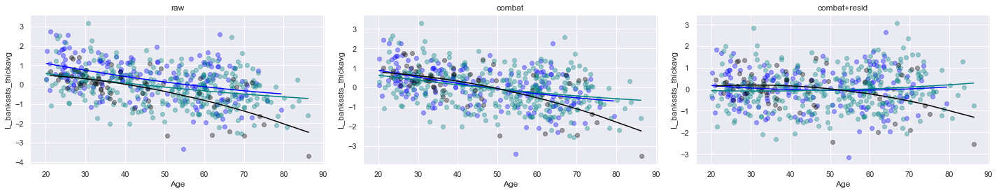

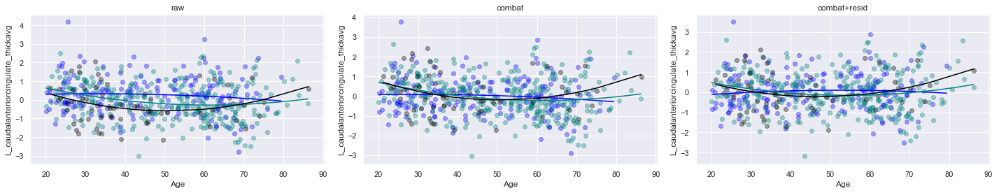

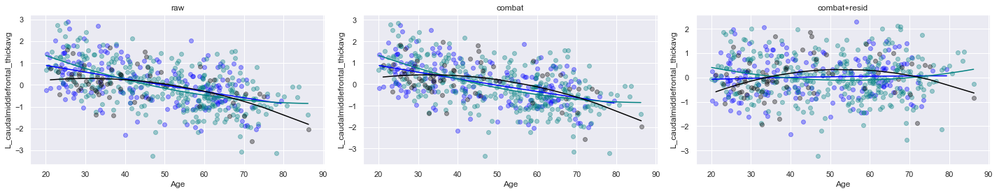

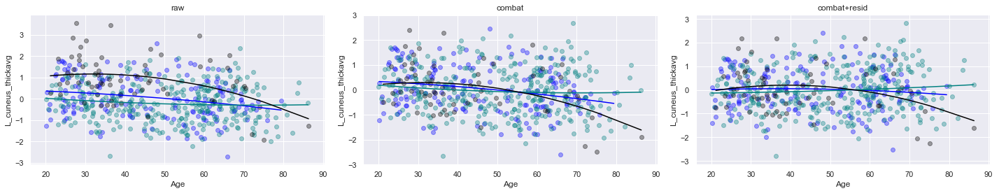

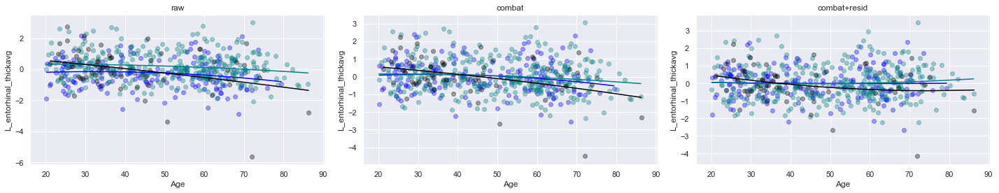

...

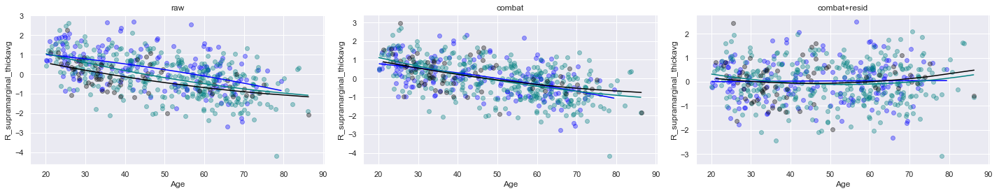

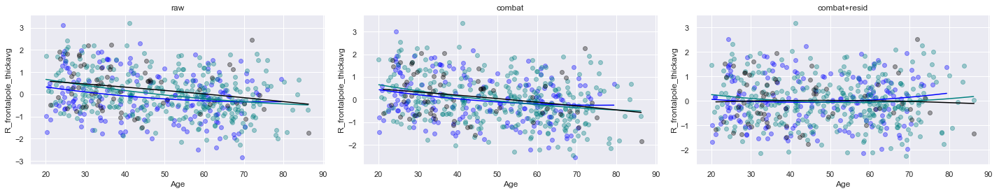

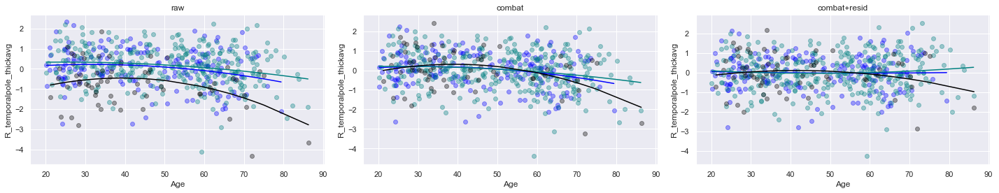

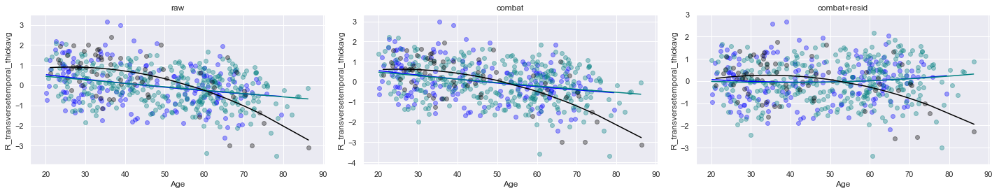

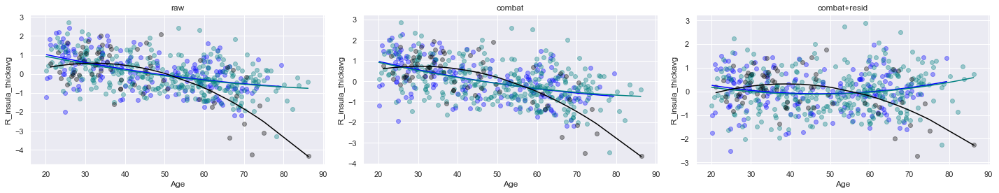

In [158]:
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')
#rsfg=60
# plot a specific region

icv=dfCT['ICV'].to_numpy()
for R_SFG in range(68):

    # i want scatter of age trajectory for each
    fig=plt.figure(figsize=[20,4])

    for site2plot in range(3):
        c = c2use[site2plot]
        plt.subplot(1,3,1)
        
        inputx=np.append(np.expand_dims(age[np.where(site==site2plot)[0]],axis=1),np.expand_dims(np.square(age[np.where(site==site2plot)[0]]),axis=1),axis=1)
        x2plot=np.squeeze(inputx[:,0])
        
        inputy=X[np.where(site==site2plot)[0],R_SFG]
        plt.title('raw')
        plt.scatter(x2plot, inputy, c=c2use[site2plot],alpha=.35)
        linear_regressor = LinearRegression()  # create object for the class
        linear_regressor.fit(inputx, inputy)  # perform linear regression
        Y_pred = linear_regressor.predict(inputx)  # make predictions
        idx=np.argsort(x2plot)
        plt.plot(x2plot[idx],Y_pred[idx],c=c2use[site2plot])
        plt.xlabel('Age');plt.ylabel(list(dfCT)[R_SFG])
        
        plt.subplot(1,3,2)
        
        inputy=Xcombat[np.where(site==site2plot)[0],R_SFG]
        plt.title('combat')
        plt.scatter(x2plot, inputy, c=c2use[site2plot],alpha=.35)
        linear_regressor = LinearRegression()  # create object for the class
        linear_regressor.fit(inputx, inputy)  # perform linear regression
        Y_pred = linear_regressor.predict(inputx)  # make predictions
        idx=np.argsort(x2plot)
        plt.plot(x2plot[idx],Y_pred[idx],c=c2use[site2plot])
        plt.xlabel('Age');plt.ylabel(list(dfCT)[R_SFG])
        
        plt.subplot(1,3,3)

        inputy=Xadjcombat[np.where(site==site2plot)[0],R_SFG]
        plt.title('combat+resid')
        plt.scatter(x2plot, inputy, c=c2use[site2plot],alpha=.35)
        linear_regressor = LinearRegression()  # create object for the class
        linear_regressor.fit(inputx, inputy)  # perform linear regression
        Y_pred = linear_regressor.predict(inputx)  # make predictions
        idx=np.argsort(x2plot)
        plt.plot(x2plot[idx],Y_pred[idx],c=c2use[site2plot])
        plt.xlabel('Age');plt.ylabel(list(dfCT)[R_SFG])

    plt.tight_layout()

    plt.show()

In [152]:
dfCT['ICV'].to_numpy()

0      1550370
1      1846870
2      1704000
3      1376040
4      1703500
        ...   
544    1683280
545    1358460
546    1714720
547    1663290
548    1724400
Name: ICV, Length: 549, dtype: int64

In [ ]:
# check for effects of sex and age